# The spark foundation 

Data Science and Business Analytics

# IPL Data Analysis

In [2]:
#importing libraries

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import numpy as np
import plotly.express as px
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

Reading data

In [4]:
deliveries=pd.read_csv('deliveries.csv')
matches=pd.read_csv('matches.csv')

In [5]:
deliveries.head()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,...,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,4,0,4,NaN,NaN,NaN
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,2,2,NaN,NaN,NaN


In [6]:
matches.head()

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,NaN
1,2,2017,Pune,2017-04-06,Mumbai Indians,Rising Pune Supergiant,Rising Pune Supergiant,field,normal,0,Rising Pune Supergiant,0,7,SPD Smith,Maharashtra Cricket Association Stadium,A Nand Kishore,S Ravi,NaN
2,3,2017,Rajkot,2017-04-07,Gujarat Lions,Kolkata Knight Riders,Kolkata Knight Riders,field,normal,0,Kolkata Knight Riders,0,10,CA Lynn,Saurashtra Cricket Association Stadium,Nitin Menon,CK Nandan,NaN
3,4,2017,Indore,2017-04-08,Rising Pune Supergiant,Kings XI Punjab,Kings XI Punjab,field,normal,0,Kings XI Punjab,0,6,GJ Maxwell,Holkar Cricket Stadium,AK Chaudhary,C Shamshuddin,NaN
4,5,2017,Bangalore,2017-04-08,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN


In [7]:
display(deliveries.info())
display(matches.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179078 entries, 0 to 179077
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   match_id          179078 non-null  int64 
 1   inning            179078 non-null  int64 
 2   batting_team      179078 non-null  object
 3   bowling_team      179078 non-null  object
 4   over              179078 non-null  int64 
 5   ball              179078 non-null  int64 
 6   batsman           179078 non-null  object
 7   non_striker       179078 non-null  object
 8   bowler            179078 non-null  object
 9   is_super_over     179078 non-null  int64 
 10  wide_runs         179078 non-null  int64 
 11  bye_runs          179078 non-null  int64 
 12  legbye_runs       179078 non-null  int64 
 13  noball_runs       179078 non-null  int64 
 14  penalty_runs      179078 non-null  int64 
 15  batsman_runs      179078 non-null  int64 
 16  extra_runs        179078 non-null  int

None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               756 non-null    int64 
 1   season           756 non-null    int64 
 2   city             749 non-null    object
 3   date             756 non-null    object
 4   team1            756 non-null    object
 5   team2            756 non-null    object
 6   toss_winner      756 non-null    object
 7   toss_decision    756 non-null    object
 8   result           756 non-null    object
 9   dl_applied       756 non-null    int64 
 10  winner           752 non-null    object
 11  win_by_runs      756 non-null    int64 
 12  win_by_wickets   756 non-null    int64 
 13  player_of_match  752 non-null    object
 14  venue            756 non-null    object
 15  umpire1          754 non-null    object
 16  umpire2          754 non-null    object
 17  umpire3          119 non-null    ob

None

#### * In columns winner,team1,team2 and toss_winner Rising Pune Supergiant and Rising Pune Supergiants are given as two different teams but in acctually they are same

* we use mask to replace them them with same values

* team1 is batting team and team2 is bowling team

In [8]:
# mask Rising Pune Supergiant to replace them with Rising Pune Supergiants


matches.loc[matches.winner == 'Rising Pune Supergiant', 'winner'] = 'Rising Pune Supergiants'
matches.loc[matches.team1 == 'Rising Pune Supergiant', 'team1'] = 'Rising Pune Supergiants'
matches.loc[matches.team2 == 'Rising Pune Supergiant', 'team2'] = 'Rising Pune Supergiants'
matches.loc[matches.toss_winner == 'Rising Pune Supergiant', 'toss_winner'] = 'Rising Pune Supergiants'


## Visualization 

[Text(0, 0, 'Sunrisers Hyderabad'),
 Text(1, 0, 'Royal Challengers Bangalore'),
 Text(2, 0, 'Mumbai Indians'),
 Text(3, 0, 'Rising Pune Supergiant'),
 Text(4, 0, 'Gujarat Lions'),
 Text(5, 0, 'Kolkata Knight Riders'),
 Text(6, 0, 'Kings XI Punjab'),
 Text(7, 0, 'Delhi Daredevils'),
 Text(8, 0, 'Chennai Super Kings'),
 Text(9, 0, 'Rajasthan Royals'),
 Text(10, 0, 'Deccan Chargers'),
 Text(11, 0, 'Kochi Tuskers Kerala'),
 Text(12, 0, 'Pune Warriors'),
 Text(13, 0, 'Rising Pune Supergiants'),
 Text(14, 0, 'Delhi Capitals')]

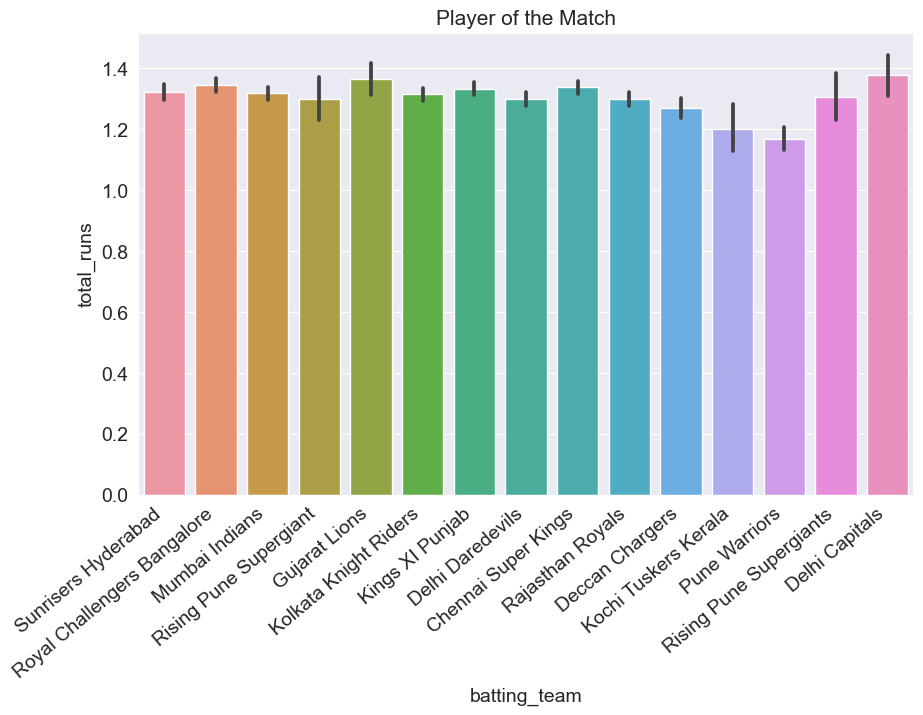

In [8]:

ax=sns.barplot(x='batting_team',y='total_runs',data=deliveries,)
plt.title("Player of the Match",fontsize=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

Text(0.5, 1.0, 'Total matches in each season')

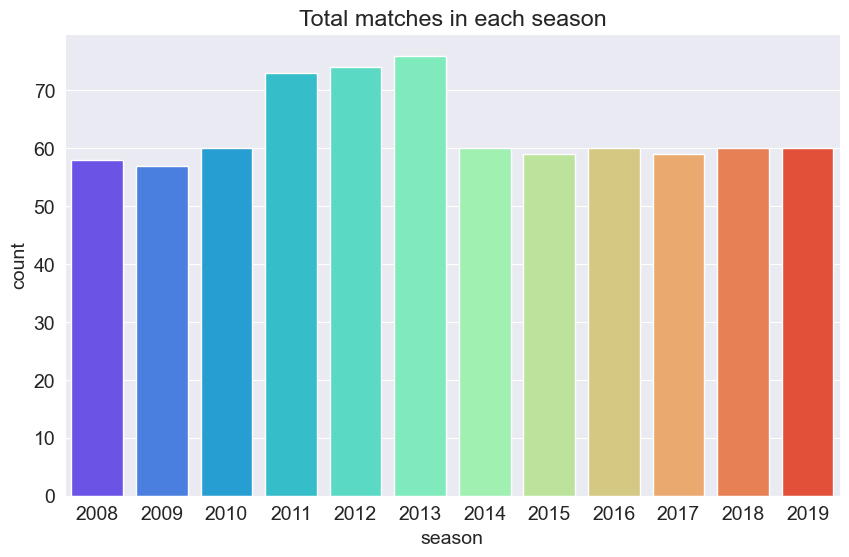

In [9]:
ax=sns.countplot(x='season',data=matches,palette='rainbow',)
plt.title('Total matches in each season')


<AxesSubplot:>

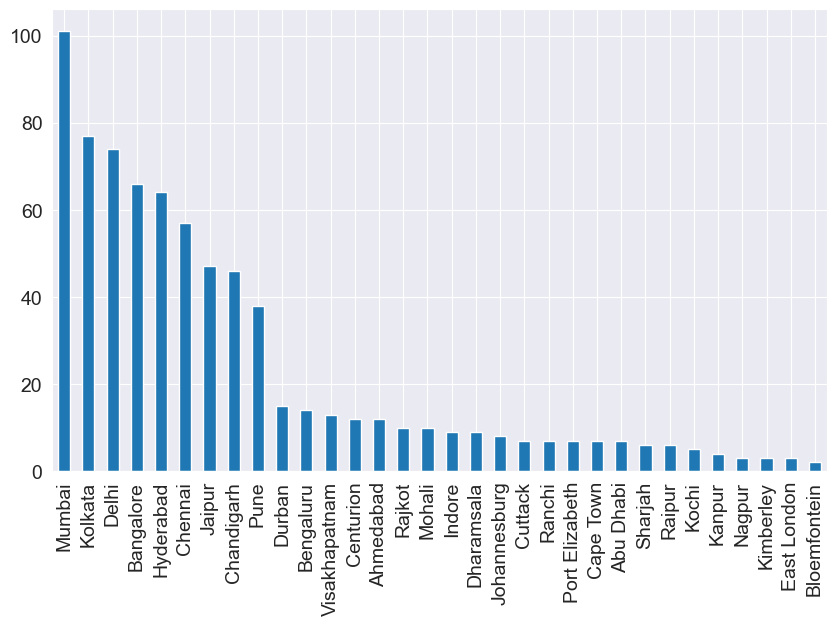

In [11]:
matches['city'].value_counts().plot(kind='bar')


* Most of the matches held in Mumbai .



(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'Sunrisers Hyderabad'),
  Text(1, 0, 'Rising Pune Supergiants'),
  Text(2, 0, 'Kolkata Knight Riders'),
  Text(3, 0, 'Kings XI Punjab'),
  Text(4, 0, 'Royal Challengers Bangalore'),
  Text(5, 0, 'Mumbai Indians'),
  Text(6, 0, 'Delhi Daredevils'),
  Text(7, 0, 'Gujarat Lions'),
  Text(8, 0, 'Chennai Super Kings'),
  Text(9, 0, 'Rajasthan Royals'),
  Text(10, 0, 'Deccan Chargers'),
  Text(11, 0, 'Pune Warriors'),
  Text(12, 0, 'Kochi Tuskers Kerala'),
  Text(13, 0, 'Delhi Capitals')])

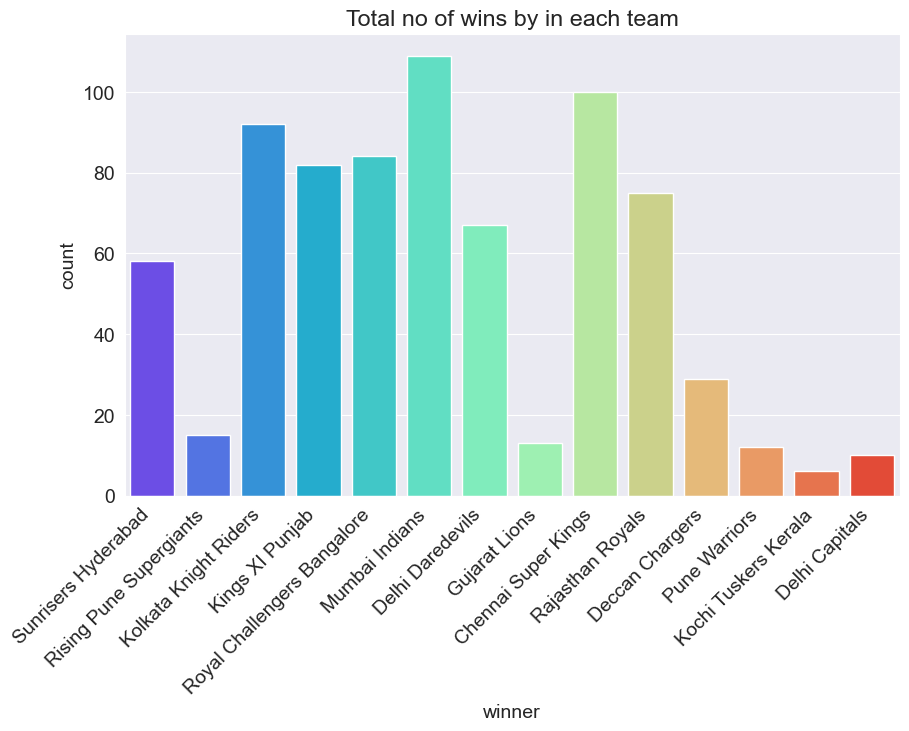

In [9]:
sns.countplot(x='winner',data=matches,palette='rainbow')
plt.title('Total no of wins by in each team')
plt.xticks(
    rotation=45, 
    horizontalalignment='right',)

* Mumbai Indain wins the most no. of matches

In [10]:
data=matches.groupby('team1')['winner'].value_counts().to_frame()

In [11]:
data['winings']=data['winner']

In [12]:
data.drop('winner',axis=1,inplace=True)

In [13]:
data=data.reset_index(level=[0,1])

In [14]:
winners=matches['winner'].to_frame().value_counts().to_frame()
winners['wins']=winners[0]
winners.reset_index(level=0,inplace=True)

In [15]:
temp = data[data['team1']=='Rajasthan Royals']

px.pie(winners,names='winner',values='wins',title='winning precents distribution  ')

* Mumbai Indains win 14.5% percents of all the matches followed by Chennai Super Kings 13.3% KolKata Knight Riders 12.2% 
* kochi Tuskers Kerala wins least no. of matches which is only 0.798% 

In [19]:
px.bar(data,x='team1',y='winings',color='winner',title="Total winnings by each team")

In [16]:
px.pie(data,names='team1',values='winings',title='winning percents of batting team ')

In [21]:
data['team1'].unique()

array(['Chennai Super Kings', 'Deccan Chargers', 'Delhi Capitals',
       'Delhi Daredevils', 'Gujarat Lions', 'Kings XI Punjab',
       'Kochi Tuskers Kerala', 'Kolkata Knight Riders', 'Mumbai Indians',
       'Pune Warriors', 'Rajasthan Royals', 'Rising Pune Supergiants',
       'Royal Challengers Bangalore', 'Sunrisers Hyderabad'], dtype=object)

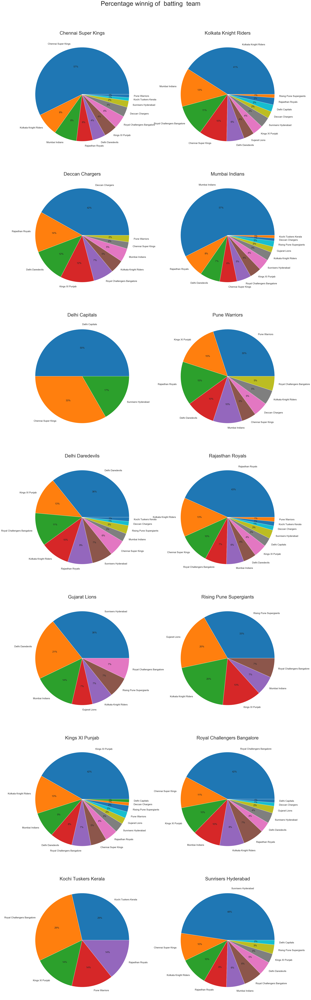

In [38]:
fig = plt.figure(figsize=(30,100)) #,dpi=1600)
fig.subplots_adjust(top=0.95)
i= 0 #this is the feature I used
r,c = 0 ,0   #these are the rows(r) and columns(c)

for i,wining_team in enumerate(data['team1'].unique()):
    if i < 7:
        
        values=data[data['team1'] == wining_team]['winings']
        keys=data[data['team1'] == wining_team]['winner']
        
        ax1 = plt.subplot2grid((7,2), (r, c))
        plt.pie(values, labels=keys, autopct='%.0f%%',textprops={'fontsize': 15})
        #weekday
        plt.title(wining_team,fontsize = 30)
        r +=1 #go one row to the bottom 
        i+=1 #go to the next feature
        
    else:
        if i == 7:
            r = 0 #reset row number as we exceeded 7 rows
            c = 1 #go into the second columnf
        values=data[data['team1'] == wining_team]['winings']
        keys=data[data['team1'] == wining_team]['winner']
        
        ax1 = plt.subplot2grid((7,2), (r, c))
        plt.pie(values, labels=keys, autopct='%.0f%%',textprops={'fontsize': 15})
        plt.title(wining_team,fontsize = 30)
        
        
        r +=1
        i+=1
fig.suptitle(' Percentage winnig of  batting  team ', fontsize=40)
plt.show()

##### Winning probability of batting team 
* Mumbai Indains win 57% of matches in which they do batting 
* Delhi capitals win 50% 
* kochi tuskers kerala only win 29% of matches in which they do batting 

In [45]:
matches.head()

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,NaN
1,2,2017,Pune,2017-04-06,Mumbai Indians,Rising Pune Supergiants,Rising Pune Supergiants,field,normal,0,Rising Pune Supergiants,0,7,SPD Smith,Maharashtra Cricket Association Stadium,A Nand Kishore,S Ravi,NaN
2,3,2017,Rajkot,2017-04-07,Gujarat Lions,Kolkata Knight Riders,Kolkata Knight Riders,field,normal,0,Kolkata Knight Riders,0,10,CA Lynn,Saurashtra Cricket Association Stadium,Nitin Menon,CK Nandan,NaN
3,4,2017,Indore,2017-04-08,Rising Pune Supergiants,Kings XI Punjab,Kings XI Punjab,field,normal,0,Kings XI Punjab,0,6,GJ Maxwell,Holkar Cricket Stadium,AK Chaudhary,C Shamshuddin,NaN
4,5,2017,Bangalore,2017-04-08,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN


In [46]:
deliveries[deliveries['match_id']==2]

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,...,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
248,2,1,Mumbai Indians,Rising Pune Supergiant,1,1,PA Patel,JC Buttler,AB Dinda,0,...,0,0,0,0,0,1,1,NaN,NaN,NaN
249,2,1,Mumbai Indians,Rising Pune Supergiant,1,2,PA Patel,JC Buttler,AB Dinda,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
250,2,1,Mumbai Indians,Rising Pune Supergiant,1,3,PA Patel,JC Buttler,AB Dinda,0,...,0,0,0,0,1,0,1,NaN,NaN,NaN
251,2,1,Mumbai Indians,Rising Pune Supergiant,1,4,JC Buttler,PA Patel,AB Dinda,0,...,0,0,0,0,5,0,5,NaN,NaN,NaN
252,2,1,Mumbai Indians,Rising Pune Supergiant,1,5,PA Patel,JC Buttler,AB Dinda,0,...,0,0,0,0,4,0,4,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
490,2,2,Rising Pune Supergiant,Mumbai Indians,20,1,MS Dhoni,SPD Smith,KA Pollard,0,...,0,0,0,0,1,0,1,NaN,NaN,NaN
491,2,2,Rising Pune Supergiant,Mumbai Indians,20,2,SPD Smith,MS Dhoni,KA Pollard,0,...,0,0,0,0,1,0,1,NaN,NaN,NaN
492,2,2,Rising Pune Supergiant,Mumbai Indians,20,3,MS Dhoni,SPD Smith,KA Pollard,0,...,0,0,0,0,1,0,1,NaN,NaN,NaN
493,2,2,Rising Pune Supergiant,Mumbai Indians,20,4,SPD Smith,MS Dhoni,KA Pollard,0,...,0,0,0,0,6,0,6,NaN,NaN,NaN


In [47]:
toss=matches.groupby('toss_winner')['winner'].value_counts().to_frame()
toss['winings']=toss['winner']
toss.drop('winner',axis=1,inplace=True)
toss=toss.reset_index(level=[0,1])

In [48]:
toss

,toss_winner,winner,winings
0,Chennai Super Kings,Chennai Super Kings,57
1,Chennai Super Kings,Mumbai Indians,7
2,Chennai Super Kings,Kings XI Punjab,5
3,Chennai Super Kings,Royal Challengers Bangalore,5
4,Chennai Super Kings,Delhi Daredevils,4
...,...,...,...
113,Sunrisers Hyderabad,Royal Challengers Bangalore,4
114,Sunrisers Hyderabad,Rajasthan Royals,2
115,Sunrisers Hyderabad,Delhi Capitals,1
116,Sunrisers Hyderabad,Kings XI Punjab,1


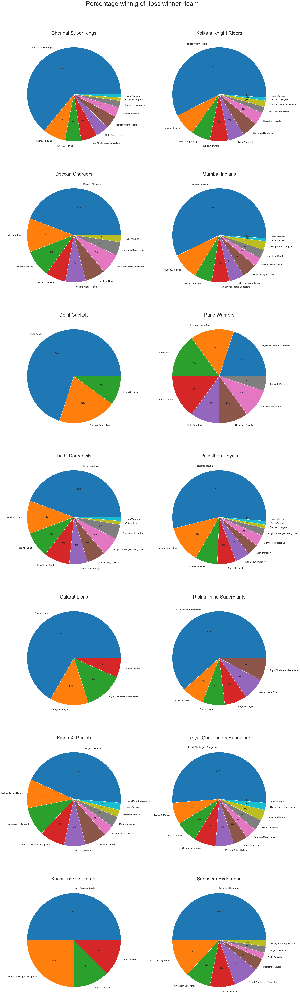

In [49]:
fig = plt.figure(figsize=(30,100)) #,dpi=1600)
fig.subplots_adjust(top=0.95)



i= 0 #this is the feature I used
r,c = 0 ,0   #these are the rows(r) and columns(c)

for i,wining_team in enumerate(toss['toss_winner'].unique()):
    if i < 7:
        
        values=toss[toss['toss_winner'] == wining_team]['winings']
        keys=toss[toss['toss_winner'] == wining_team]['winner']
        
        ax1 = plt.subplot2grid((7,2), (r, c))
        plt.pie(values, labels=keys, autopct='%.0f%%',textprops={'fontsize': 15})
        #weekday
        plt.title(wining_team, fontsize=30)
        r +=1 #go one row to the bottom 
        i+=1 #go to the next feature
        
    else:
        if i == 7:
            r = 0 #reset row number as we exceeded 7 rows
            c = 1 #go into the second columnf
        values=toss[toss['toss_winner'] == wining_team]['winings']
        keys=toss[toss['toss_winner'] == wining_team]['winner']
        
        ax1 = plt.subplot2grid((7,2), (r, c))
        plt.pie(values, labels=keys, autopct='%.0f%%',textprops={'fontsize': 15})
        plt.title(wining_team, fontsize=30)
        
        r +=1
        i+=1
fig.suptitle(' Percentage winnig of  toss winner  team ', fontsize=40)
plt.show()

##### Winning probability of toss_winner team 
* Delhi capitals win 70% of matches in which they won toss
* Gujarat Lions win 67% 
* Pune warriors only win 20% of matches in which they won toss which is least among all
* Except pune warriors  minimum 43% of the times winner are those who won the toss
> Can you explain this why its happening?

In [52]:

temp=matches.groupby('toss_winner')['team1'].value_counts().to_frame()
temp['batting']=temp['team1']
temp.drop('team1',axis=1,inplace=True)
temp=temp.reset_index(level=[0,1])

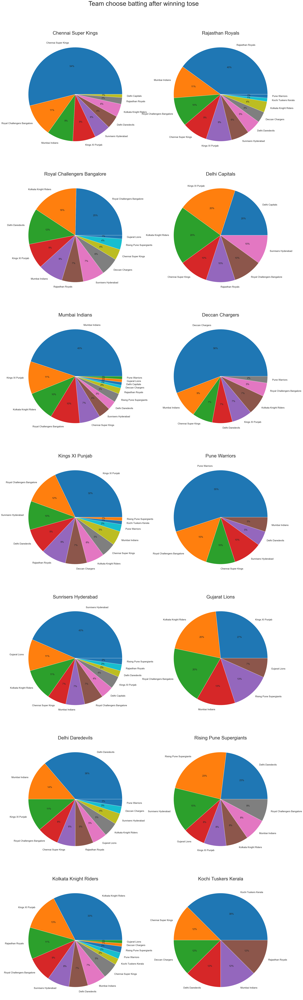

In [54]:

fig = plt.figure(figsize=(30,100)) #,dpi=1600)
fig.subplots_adjust(top=0.95)
i= 0 #this is the feature I used
r,c = 0 ,0   #these are the rows(r) and columns(c)

for i,wining_team in enumerate(temp['team1'].unique()):
    if i < 7:

        values=temp[temp['toss_winner'] == wining_team]['batting']
        keys=temp[temp['toss_winner'] == wining_team]['team1']

        ax1 = plt.subplot2grid((7,2), (r, c))
        plt.pie(values, labels=keys, autopct='%.0f%%',textprops={'fontsize': 15})
        #weekday
        plt.title(wining_team, fontsize=30)
        r +=1 #go one row to the bottom 
        i+=1 #go to the next feature

    else:
        if i == 7:
            r = 0 #reset row number as we exceeded 7 rows
            c = 1 #go into the second columnf
        values=temp[temp['toss_winner'] == wining_team]['batting']
        keys=temp[temp['toss_winner'] == wining_team]['team1']

        ax1 = plt.subplot2grid((7,2), (r, c))
        plt.pie(values, labels=keys, autopct='%.0f%%',textprops={'fontsize': 15})
        plt.title(wining_team, fontsize=30)

        r +=1
        i+=1
fig.suptitle('Team choose batting after winning tose', fontsize=40)
plt.show()

Text(0.5, 1.0, 'Results of the matches')

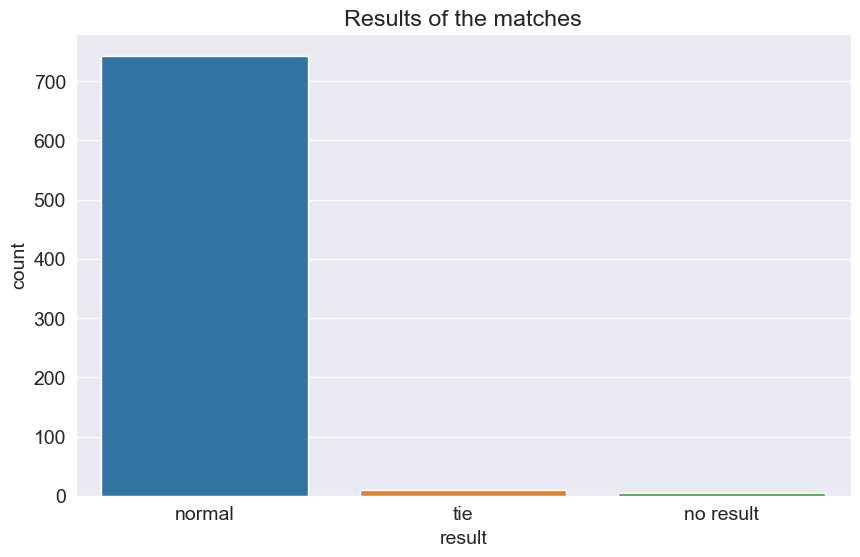

In [56]:
sns.countplot(x='result',data=matches)
plt.title('Results of the matches')

In [96]:
deliveries[deliveries[['batsman','total_runs']]['batsman']=='DA Warner']['total_runs'].sum()

4975

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'SK Raina'),
  Text(1, 0, 'V Kohli'),
  Text(2, 0, 'RG Sharma'),
  Text(3, 0, 'DA Warner'),
  Text(4, 0, 'S Dhawan'),
  Text(5, 0, 'CH Gayle'),
  Text(6, 0, 'RV Uthappa'),
  Text(7, 0, 'MS Dhoni'),
  Text(8, 0, 'AB de Villiers'),
  Text(9, 0, 'G Gambhir'),
  Text(10, 0, 'AM Rahane'),
  Text(11, 0, 'KD Karthik'),
  Text(12, 0, 'SR Watson'),
  Text(13, 0, 'AT Rayudu'),
  Text(14, 0, 'YK Pathan'),
  Text(15, 0, 'BB McCullum'),
  Text(16, 0, 'PA Patel'),
  Text(17, 0, 'MK Pandey'),
  Text(18, 0, 'KA Pollard'),
  Text(19, 0, 'V Sehwag')])

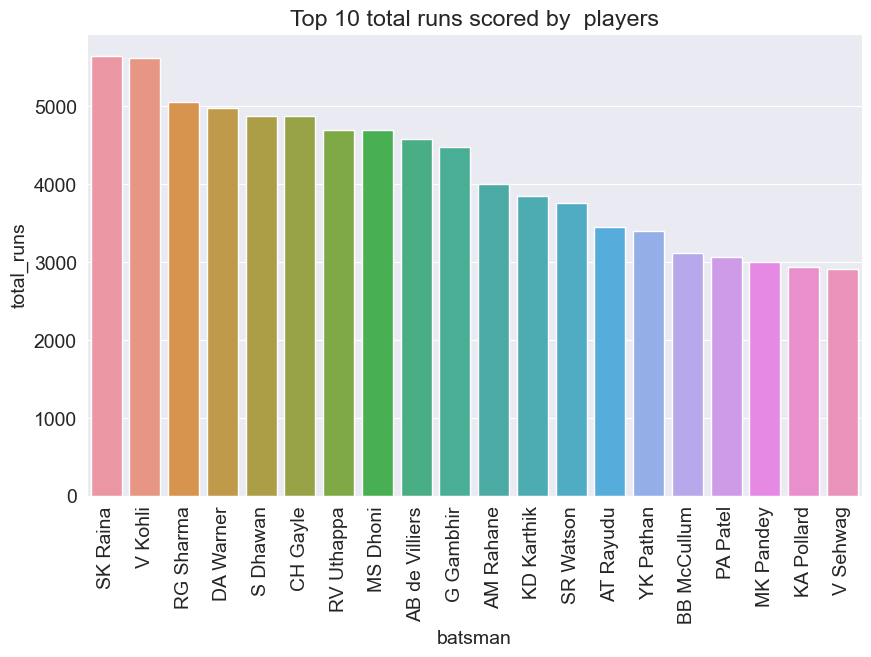

In [113]:
total_run=deliveries.groupby(["batsman"]).total_runs.sum().reset_index()
total_run.sort_values('total_runs',ascending=False)
fig=sns.barplot(data=total_run.nlargest(20, 'total_runs'),x='batsman',y='total_runs')
plt.title('Top 10 total runs scored by  players')
plt.xticks(
    rotation=90,)

In [21]:
pd.set_option('display.max_columns', None)
deliveries.sample(5)

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,wide_runs,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
63333,268,1,Royal Challengers Bangalore,Pune Warriors,8,6,CH Gayle,V Kohli,M Manhas,0,0,0,0,0,0,2,0,2,NaN,NaN,NaN
19478,83,2,Rajasthan Royals,Chennai Super Kings,4,4,SA Asnodkar,GC Smith,MS Gony,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
76281,324,1,Chennai Super Kings,Pune Warriors,11,5,MS Dhoni,SK Raina,AB Dinda,0,0,0,0,0,0,1,0,1,NaN,NaN,NaN
87156,369,1,Kings XI Punjab,Delhi Daredevils,12,1,Azhar Mahmood,DJ Hussey,UT Yadav,0,0,0,0,0,0,1,0,1,NaN,NaN,NaN
55116,233,1,Deccan Chargers,Royal Challengers Bangalore,18,4,R Sharma,RJ Harris,JH Kallis,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 [Text(0, 0, 'Mumbai Indians'),
  Text(1, 0, 'Royal Challengers Bangalore'),
  Text(2, 0, 'Kings XI Punjab'),
  Text(3, 0, 'Kolkata Knight Riders'),
  Text(4, 0, 'Chennai Super Kings'),
  Text(5, 0, 'Delhi Daredevils'),
  Text(6, 0, 'Rajasthan Royals'),
  Text(7, 0, 'Sunrisers Hyderabad'),
  Text(8, 0, 'Deccan Chargers'),
  Text(9, 0, 'Pune Warriors'),
  Text(10, 0, 'Gujarat Lions'),
  Text(11, 0, 'Delhi Capitals'),
  Text(12, 0, 'Rising Pune Supergiant'),
  Text(13, 0, 'Rising Pune Supergiants'),
  Text(14, 0, 'Kochi Tuskers Kerala')])

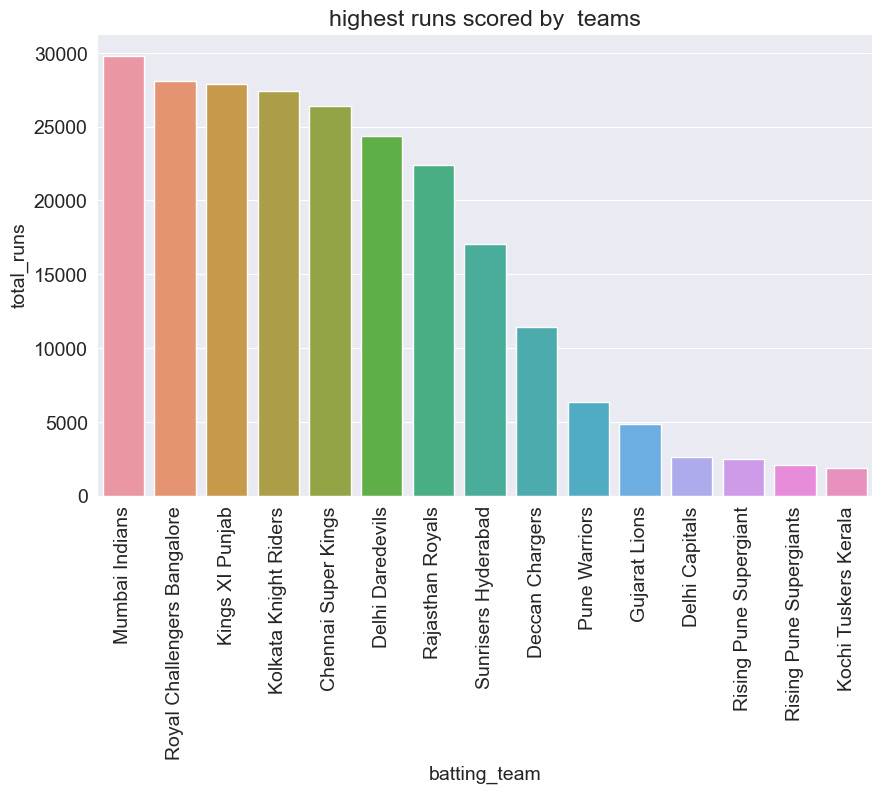

In [22]:
total_run_by_team=deliveries.groupby(["batting_team"]).total_runs.sum().reset_index()
total_run_by_team.sort_values('total_runs',ascending=False)
fig=sns.barplot(data=total_run_by_team.nlargest(20, 'total_runs'),x='batting_team',y='total_runs')
plt.title('highest runs scored by  teams')
plt.xticks(
    rotation=90,)

In [25]:
deliveries.head(5)

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,wide_runs,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,0,0,0,0,0,0,4,0,4,NaN,NaN,NaN
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,2,0,0,0,0,0,2,2,NaN,NaN,NaN
